### Importing necessary packages

In [11]:
import pandas as pd
pd.options.mode.chained_assignment = None 
import numpy as np
import re
import nltk
import seaborn as sns
from tqdm import tqdm
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

### Unpickling file and Loading data

In [12]:
import pickle
pickle_file = open("RQ3_Input_Dataset2.data",'rb')
#pickle_file = open("C:\\Users\\snigd\\RQ3_Input_Dataset2.data",'rb')
##RQ3_Input_Dataset1.data
##RQ3_Input_Dataset2.data

pickle_data = pickle.load(pickle_file)
df = pd.DataFrame(pickle_data)

### Necessary Data cleaning

In [13]:
pd.set_option('display.max_columns', None)

df['RvScoreWorkAtmosphere'] = df['RvScoreWorkAtmosphere'].round(0)

df['RvScoreCohesionAmongColleagues'] = df['RvScoreCohesionAmongColleagues'].round(0)

df['RvScoreEqualRights'] = df['RvScoreEqualRights'].round(0)

df['RvScoreDealingWithOlderColleagues'] = df['RvScoreDealingWithOlderColleagues'].round(0)

df['RvScoreEnvironmentalSocialAwareness'] = df['RvScoreEnvironmentalSocialAwareness'].round(0)

df['RvScoreWorkLifeBalance'] = df['RvScoreWorkLifeBalance'].round(0)

df.head(3)


,Org,OrgSector,RverMonthYear,RverReviewer,RverPosition,RverLoc,RverRecom,RvReviewAbout,RvScore,RvComment,RvScoreWorkAtmosphere,RvScoreCohesionAmongColleagues,RvScoreEqualRights,RvScoreDealingWithOlderColleagues,RvScoreEnvironmentalSocialAwareness,Corona1,Corona2,Corona3,RvScoreWorkLifeBalance,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,topic10,topic11,topic12,topic13,topic14,topic15,topic16,topic17,topic18,topic19,topic20,topic21,topic22,forTSNEYear,forTSNECity,topic0_max,topic1_max,topic2_max,topic3_max,topic4_max,topic5_max,topic6_max,topic7_max,topic8_max,topic9_max,topic10_max,topic11_max,topic13_max,topic14_max,topic15_max,topic16_max,topic17_max,topic18_max,topic19_max,topic21_max,score101,topicXmaxboolXcss0,topicXmaxboolXcss1,topicXmaxboolXcss2,topicXmaxboolXcss3,topicXmaxboolXcss4,topicXmaxboolXcss5,topicXmaxboolXcss6,topicXmaxboolXcss7,topicXmaxboolXcss8,topicXmaxboolXcss9,topicXmaxboolXcss10,topicXmaxboolXcss11,topicXmaxboolXcss13,topicXmaxboolXcss14,topicXmaxboolXcss15,topicXmaxboolXcss16,topicXmaxboolXcss17,topicXmaxboolXcss18,topicXmaxboolXcss19,topicXmaxboolXcss21,NewRverCategory,PreviousVsCurrentFlag,NewRverCategory_Employee,NewRverCategory_Management,NewRverCategory_Qualification,NewRverCategory_TemporaryEmployed,featureYear,state,featureState,featurePosition,featureOrg,featureRecom,featureSentiScoreBool,featureSentiScorenormalized,RvScoreScaled,RvScoreWorkAtmosphereScaled,RvScoreCohesionAmongColleaguesScaled,RvScoreEqualRightsScaled,RvScoreDealingWithOlderColleaguesScaled,RvScoreEnvironmentalSocialAwarenessScaled,RvScoreWorkLifeBalanceScaled,Mean_value
1,Instone Real Estate Group AG,Immobilien,May 2020,3,Angestellte/r oder Arbeiter/in,Hat zum Zeitpunkt der Bewertung im Bereich Adm...,Empfohlen,Overall,4.5,Wenn Transparenz und Wertschätzung aufeinande...,5.0,5.0,5.0,5.0,5.0,NA,NA,NA,4.0,0.000000,0.071954,0.000000,0.000000,0.000000,0.00000,0.000000,0.227733,0.071895,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.112077,0.137255,0.000000,0.071894,0.202615,0.000000,0.000000,2020,Köln,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2.9287,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666963,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Employee,1,1,0,0,0,1.00,Nordrhein-Westfalen,0.59,0.07,0.461,1.0,1.0,0.345304,0.90,1.0,1.0,4.7,1.0,4.7,0.8,4.700000
2,Instone Real Estate Group AG,Immobilien,October 2019,4,Ex-Angestellte/r oder Arbeiter/in,Hat im Bereich Personal / Aus- und Weiterbildu...,Nicht empfohlen,Overall,3.2,Anspruch und Wirklichkeit klaffen auseinander...,3.0,3.0,3.0,4.0,2.0,NA,NA,NA,3.0,0.000000,0.000000,0.111966,0.000000,0.000000,0.00000,0.079119,0.000000,0.076924,0.086509,0.279106,0.000000,0.000000,0.000000,0.076640,0.000000,0.000000,0.000000,0.000000,0.177839,0.000000,0.000000,0.000000,2019,Essen,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.2452,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.068437,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Employee,0,1,0,0,0,0.91,Niedersachsen,0.53,0.21,0.461,0.0,1.0,0.028910,0.64,0.6,0.6,0.6,0.8,0.4,0.6,3.028571
3,Instone Real Estate Group AG,Immobilien,October 2019,5,Führungskraft / Management,Hat zum Zeitpunkt der Bewertung bei Instone Re...,Empfohlen,Overall,4.8,Toller Arbeitgeber Tolle Truppe Auch bei lä...,5.0,5.0,5.0,5.0,5.0,NA,NA,NA,4.0,0.010753,0.010753,0.010756,0.225807,0.010753,0.11828,0.010753,0.010753,0.010754,0.010755,0.440842,0.010753,0.010754,0.010754,0.010753,0.010753,0.010756,0.010754,0.010753,0.010753,0.010753,0.010753,0.010753,2019,Essen,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.1062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.046817,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Management,1,0,1,0,0,0.91,Niedersachsen,0.53,0.79,0.461,1.0,1.0,0.012521,0.96,1.0,1.0,1.0,1.0,1.0,0.8,4.828571


### Data slicing as per industry sector

In [14]:
conditions = [(df["OrgSector"] == 'Immobilien'),
              (df["OrgSector"] == 'Elektro/Elektronik'),
              (df["OrgSector"] == 'Sonstige Branchen'),
              (df["OrgSector"] == 'Maschinenbau'),
              (df["OrgSector"] == 'Handel'),
              (df["OrgSector"] == 'Internet'),
              (df["OrgSector"] == 'Medizin/Pharma'),
              (df["OrgSector"] == 'IT'),
              (df["OrgSector"] == 'Automobil'),
              (df["OrgSector"] == 'Industrie'),
              (df["OrgSector"] == 'Dienstleistung'),
              (df["OrgSector"] == 'Energie'),
              (df["OrgSector"] == 'Marketing/Werbung/PR'),
              (df["OrgSector"] == 'Nahrungsmittel/Landwirtschaft'),              
              (df["OrgSector"] == 'Chemie'),
              (df["OrgSector"] == 'Finanz'),
              (df["OrgSector"] == 'Banken'),
              (df["OrgSector"] == 'Transport/Verkehr/Logistik'),
              (df["OrgSector"] == 'Telekommunikation'),
              (df["OrgSector"] == 'Bau/Architektur'),
              (df["OrgSector"] == 'Versicherung'),
              (df["OrgSector"] == 'Kunst/Kultur'),
              (df["OrgSector"] == 'Textil'),
              (df["OrgSector"] == ' Immobilien'),
              (df["OrgSector"] == 'Medien'),
              (df["OrgSector"] == 'Personalwesen & -beschaffung'),
              (df["OrgSector"] == ' Industrie'),
              (df["OrgSector"] == 'Sport/Beauty'),
              (df["OrgSector"] == 'Druck/Verpackung'),
              (df["OrgSector"] == 'Medizintechnik'),
              (df["OrgSector"] == 'Forschung/Entwicklung'),
              (df["OrgSector"] == 'Beratung/Consulting')
              ]
choices_NewOrgSector = ['Finance, Insurance, Real Estate', 'Manufacturing', 'Others', 'Manufacturing', 'Retail Trade',
                        'Services','Manufacturing','Manufacturing','Manufacturing','Manufacturing','Services',
                        'Transportation & Public Utilities','Services','Agriculture, Forestry, Fishing','Manufacturing',
                        'Finance, Insurance, Real Estate','Finance, Insurance, Real Estate',
                        'Transportation & Public Utilities',
                        'Transportation & Public Utilities','Construction','Finance, Insurance, Real Estate','Services',
                        'Manufacturing','Finance, Insurance, Real Estate','Services','Services','Manufacturing',
                        'Services','Manufacturing','Manufacturing','Services','Services']
df["NewOrgSector"] = np.select(conditions, choices_NewOrgSector, default='NaN')

### Normalising Sentiment Score

In [15]:
conditions = [
    (df['score101'] > 0), (df['score101'] < 0), (df['score101'] ==0)]
choices = ['Positive', 'Negative', 'Neutral']
df['ForTSNEScore101'] = np.select(conditions, choices, default='NaN')

In [16]:
# Checking no. of reviews in each Industry sector
df['NewOrgSector'].value_counts()

Manufacturing                        3704
Services                             1019
Transportation & Public Utilities     983
Finance, Insurance, Real Estate       886
Retail Trade                          365
Others                                 51
Construction                           31
Agriculture, Forestry, Fishing         23
Name: NewOrgSector, dtype: int64

### TSNE Plots for each industry sector

Tsne_Model for Manufacturing
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 3704 samples in 0.038s...
[t-SNE] Computed neighbors for 3704 samples in 1.255s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3704
[t-SNE] Computed conditional probabilities for sample 2000 / 3704
[t-SNE] Computed conditional probabilities for sample 3000 / 3704
[t-SNE] Computed conditional probabilities for sample 3704 / 3704
[t-SNE] Mean sigma: 0.118492
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.914886
[t-SNE] KL divergence after 2000 iterations: 1.402881
Tsne_Model for Transportation
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 983 samples in 0.004s...
[t-SNE] Computed neighbors for 983 samples in 0.089s...
[t-SNE] Computed conditional probabilities for sample 983 / 983
[t-SNE] Mean sigma: 0.146203
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.038261
[t-SNE] KL divergence after 2000 iterations: 1.092277


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Services
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1019 samples in 0.015s...
[t-SNE] Computed neighbors for 1019 samples in 0.151s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1019
[t-SNE] Computed conditional probabilities for sample 1019 / 1019
[t-SNE] Mean sigma: 0.145470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.846626
[t-SNE] KL divergence after 1550 iterations: 1.140801


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

Tsne_Model for Finance
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 886 samples in 0.007s...
[t-SNE] Computed neighbors for 886 samples in 0.132s...
[t-SNE] Computed conditional probabilities for sample 886 / 886
[t-SNE] Mean sigma: 0.152887
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.114761
[t-SNE] KL divergence after 1100 iterations: 1.099364


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

Tsne_Model for Retail
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 365 samples in 0.000s...
[t-SNE] Computed neighbors for 365 samples in 0.032s...
[t-SNE] Computed conditional probabilities for sample 365 / 365
[t-SNE] Mean sigma: 0.180537
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.135689
[t-SNE] KL divergence after 1100 iterations: 0.644159


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

Tsne_Model for Others
[t-SNE] Computing 50 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.001s...
[t-SNE] Computed neighbors for 51 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.865623
[t-SNE] KL divergence after 2000 iterations: 0.619170


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

Tsne_Model for Construction
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.368912
[t-SNE] KL divergence after 2000 iterations: 0.505864


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

Tsne_Model for Agriculture
[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 23 samples in 0.000s...
[t-SNE] Computed neighbors for 23 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 23 / 23
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.680935
[t-SNE] KL divergence after 1900 iterations: 0.436947


<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))
<ipython-input-17-e5a48f7efe5f>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,

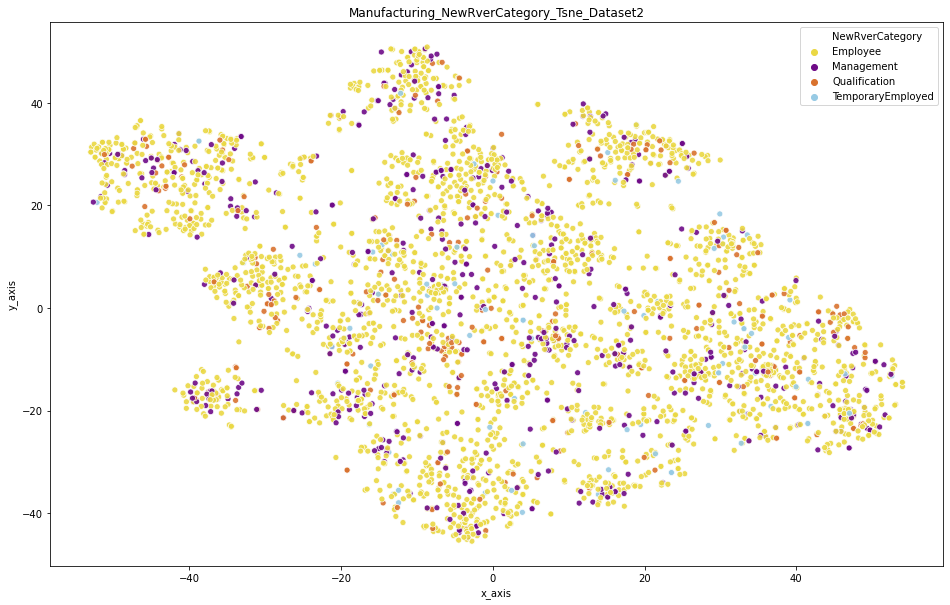

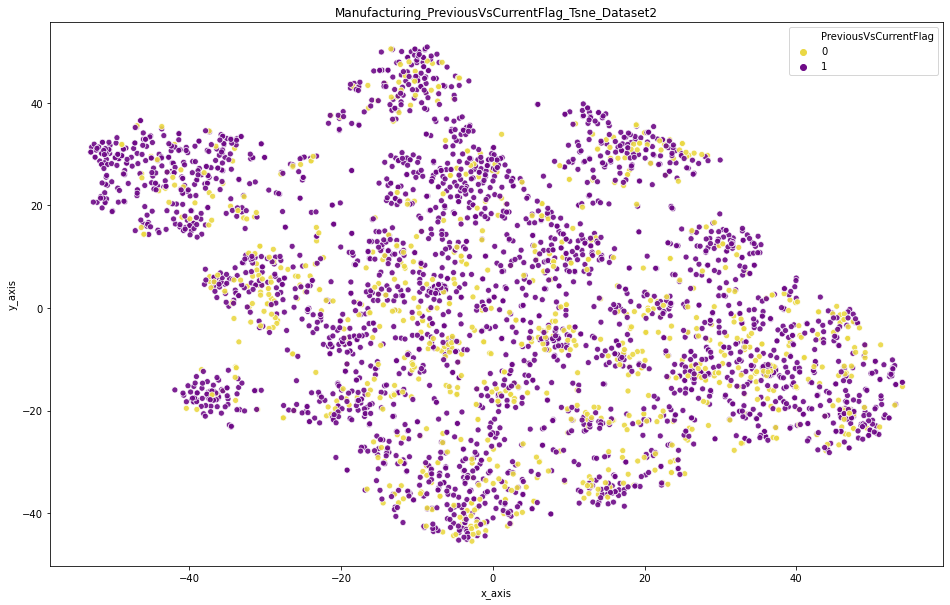

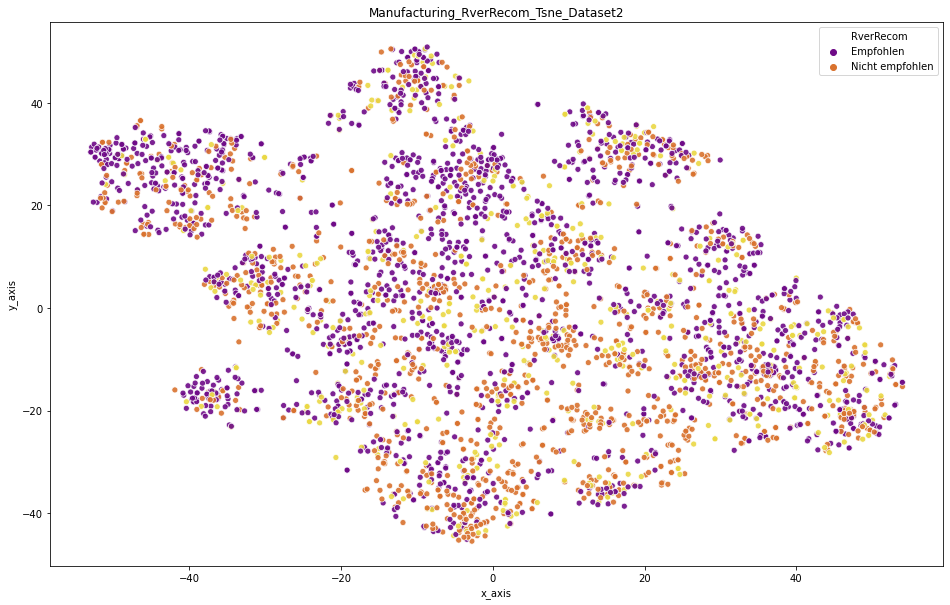

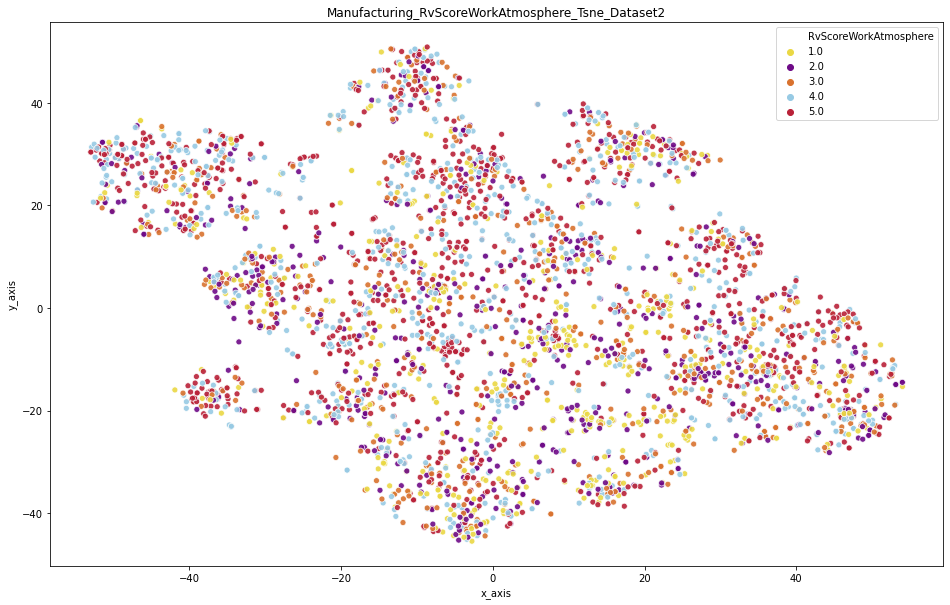

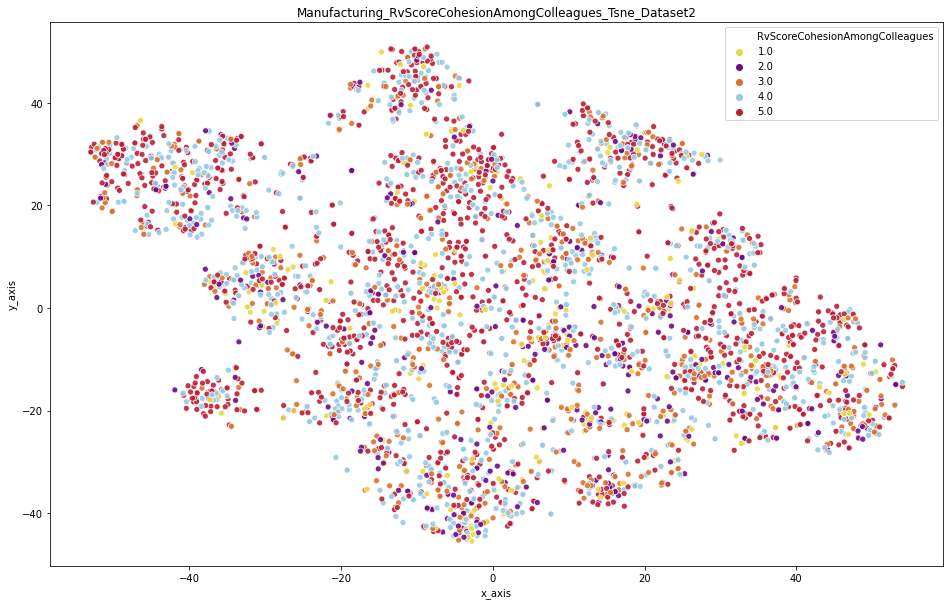

...

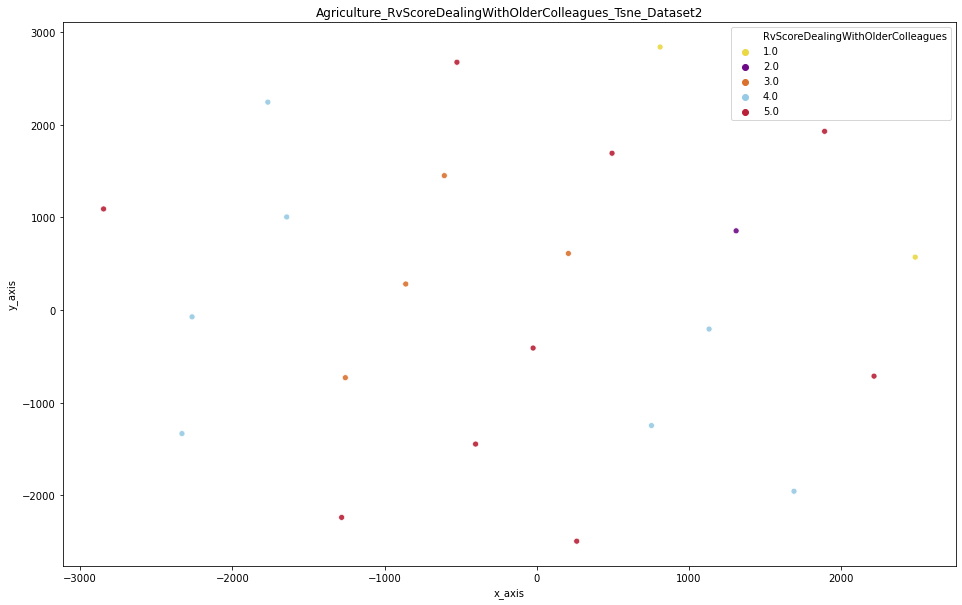

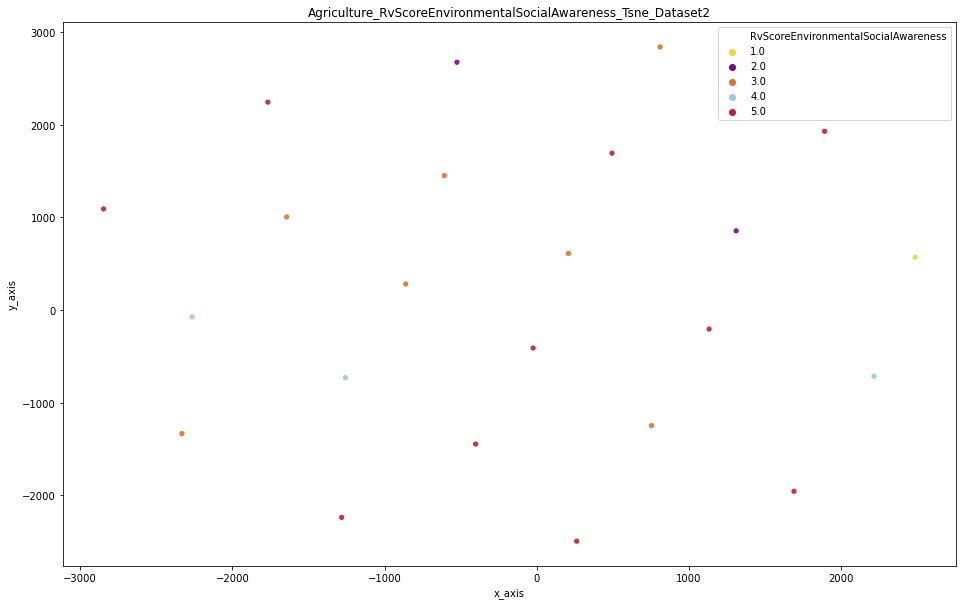

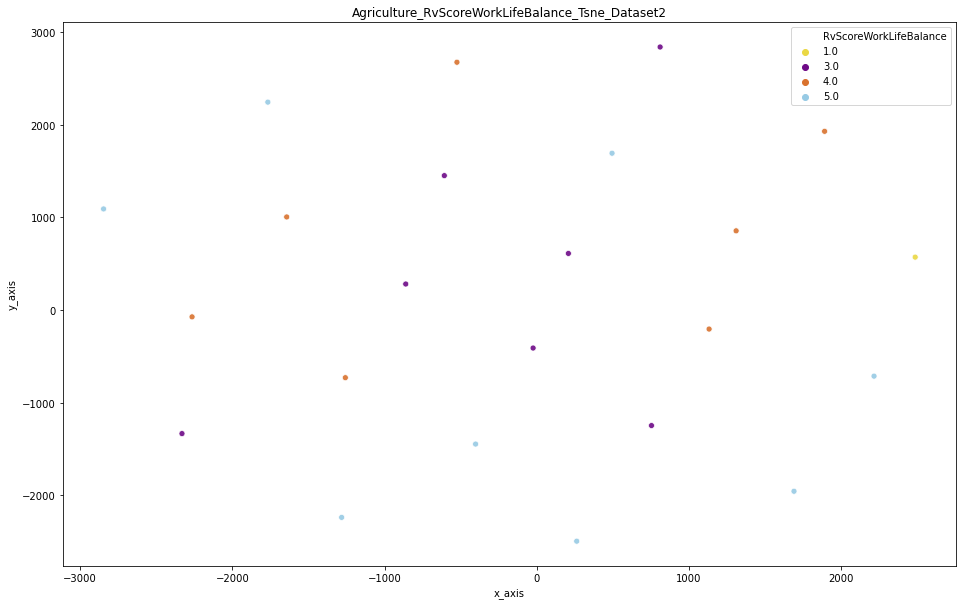

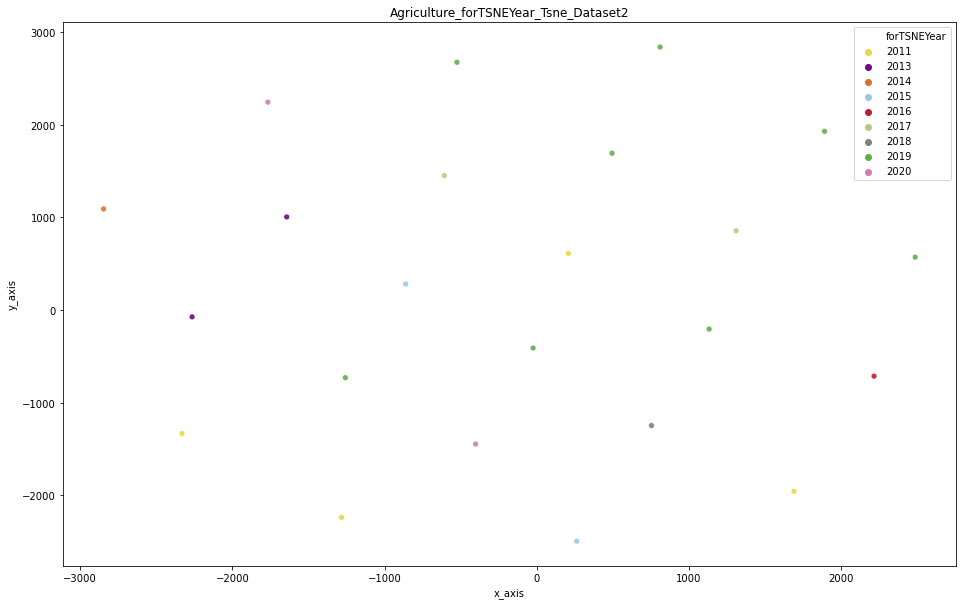

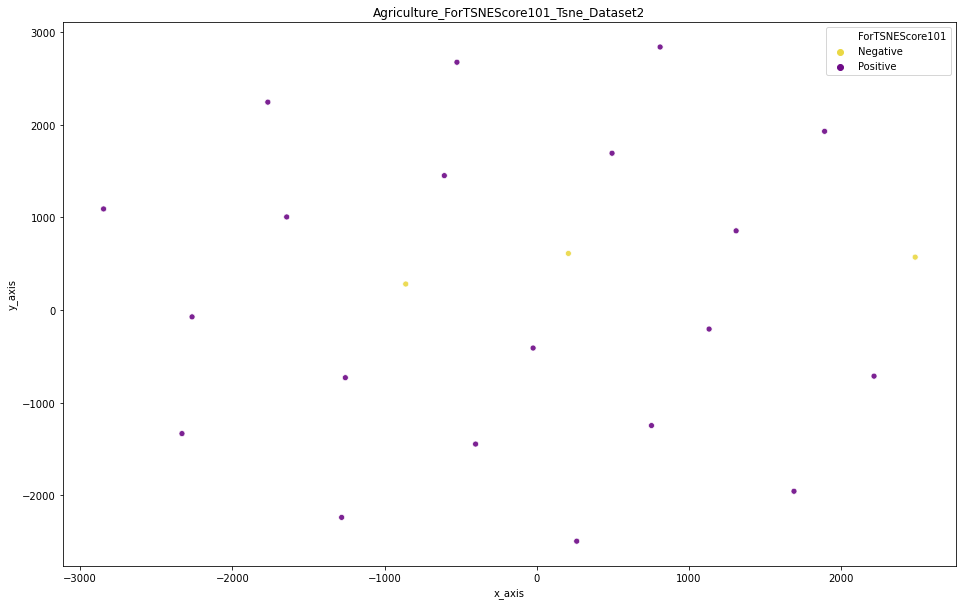

In [17]:
from sklearn.manifold import TSNE
ldf=[]
Tsne_File = ['Manufacturing', 'Transportation', 'Services','Finance','Retail','Others','Construction','Agriculture']
Count = 0
df_Manufacturing = df[df['NewOrgSector'] == 'Manufacturing']
ldf.append(df_Manufacturing)
df_Transportation = df[df['NewOrgSector'] == 'Transportation & Public Utilities']
ldf.append(df_Transportation)
df_Services = df[df['NewOrgSector'] == 'Services']
ldf.append(df_Services)
df_Finance = df[df['NewOrgSector'] == 'Finance, Insurance, Real Estate']
ldf.append(df_Finance)
df_Retail  = df[df['NewOrgSector'] == 'Retail Trade']
ldf.append(df_Retail)
df_Others = df[df['NewOrgSector'] == 'Others']
ldf.append(df_Others)
df_Construction = df[df['NewOrgSector'] == 'Construction']
ldf.append(df_Construction)
df_Agriculture = df[df['NewOrgSector'] == 'Agriculture, Forestry, Fishing']
ldf.append(df_Agriculture)

for df_sector in ldf :
    df_sector1 = df_sector[['topic0', 'topic1', 'topic2', 'topic3', 'topic4', 'topic5','topic6','topic7',
                                      'topic8','topic9','topic10','topic11','topic13','topic14','topic15','topic16',
                                      'topic17','topic18','topic19','topic21']] ##Eliminate topic12, topic20, topic22
    for i in range(0, 23):
        if i in [12, 20, 22]:
            continue
        col_name = 'topic' + str(i)
        df_sector1[col_name] = df_sector1[col_name].astype(float)
    
#df_Manufacturing1.dtypes
    result_df_sector = df_sector1.to_numpy() 
    print('Tsne_Model for '+ Tsne_File[Count] )
    
# Tsne model fitting
    tsne_model = TSNE(n_components=2, perplexity=70, learning_rate=600, n_iter=2000, verbose=1, random_state=7, angle=.5,
                  init='pca')
# 18-D -> 2-D #22-D -> 2-D
    tsne_Org_Sector = tsne_model.fit_transform(result_df_sector) # result is document-topic matrix from LDA

    tsne_Org_Sector_df = pd.DataFrame(tsne_Org_Sector)
    df_sector_copy = df_sector

    df_sector_copy.reset_index(inplace = True)
    df_sector_copy['x_axis']=tsne_Org_Sector_df[0]
    df_sector_copy['y_axis']=tsne_Org_Sector_df[1]
#df_Manufacturing_copy

# TSNE Plots for all features
    
    features = ['NewRverCategory','PreviousVsCurrentFlag','RverRecom','RvScoreWorkAtmosphere','RvScoreCohesionAmongColleagues',
                'RvScoreEqualRights','RvScoreDealingWithOlderColleagues','RvScoreEnvironmentalSocialAwareness',
                'RvScoreWorkLifeBalance','forTSNEYear','ForTSNEScore101'#,'tsne_state'
               ]
    
    for metadata in features:
        plt.figure(figsize=(16,10))
        colors = ["#ead844", "#6e0a87", "#d9722e", "#97cae4", "#b92138", "#c3c484", "#808281", "#61ae4b", "#cf7eb2", "#476bb5", "#dd8969", "#481191", "#dcab35", "#92008c", "#e6f55e", "#7d1a13", "#93b841", "#6e3715", "#d0322a", "#2b3919"]
        colors2 = colors[:df_sector_copy[metadata].nunique()]
        sns.scatterplot(
            x='x_axis', y='y_axis',
            hue=df_sector_copy[metadata],
            data=df_sector_copy[['x_axis','y_axis']],
            legend="full",
            alpha=0.9,
            palette= sns.color_palette(colors2),
            hue_order = sorted(df_sector_copy[metadata].unique())    
        )

        plt.title(Tsne_File[Count]+ '_' + metadata + '_Tsne_Dataset2', fontdict=None, loc='center')
        plt.savefig(Tsne_File[Count]+ '_' + metadata + '_Tsne_Dataset2.pdf')
    Count = Count + 1

